In [1]:
import os

# Define o backend do Keras como TensorFlow.
os.environ["KERAS_BACKEND"] = "tensorflow"

import sys

import tensorflow as tf
import keras
from keras import layers  # Importa o módulo de camadas do Keras.
from keras import ops  # Importa operações avançadas do Keras.
import pandas as pd  # Biblioteca para manipulação e análise de dados.
import numpy as np  # Biblioteca para computação numérica com arrays multidimensionais.
import cv2  # Biblioteca OpenCV para processamento de imagens e vídeos.
import matplotlib.pyplot as plt  # Biblioteca para criação de gráficos e visualização de dados.

# Define uma semente aleatória para reprodutibilidade de resultados ao usar funções do Keras.
keras.utils.set_random_seed(123)


In [2]:
# Caminho relativo para a pasta onde estão armazenadas as anotações do dataset.
annotation_folder = "/dataset/"

# Verifica se a pasta de anotações existe no caminho absoluto do diretório atual.
if not os.path.exists(os.path.abspath(".") + annotation_folder):
    # Caso a pasta não exista, faz o download do arquivo de anotações compactado (val.tar.gz)
    # usando a função utilitária do Keras. O arquivo será armazenado no cache do caminho absoluto atual.
    annotation_zip = keras.utils.get_file(
        "val.tar.gz",  # Nome do arquivo a ser baixado.
        cache_subdir=os.path.abspath("."),  # Subdiretório do cache onde o arquivo será salvo.
        origin="http://diode-dataset.s3.amazonaws.com/val.tar.gz",  # URL de origem do arquivo.
        extract=True,  # Indica que o arquivo deve ser extraído após o download.
    )


2774625282/2774625282 ━━━━━━━━━━━━━━━━━━━━ 69s 0us/step


In [3]:
# Define o caminho para a pasta que contém os arquivos do dataset.
path = "val/indoors"

# Inicializa uma lista vazia para armazenar os caminhos dos arquivos encontrados.
filelist = []

# Percorre recursivamente a estrutura de diretórios começando pelo caminho definido.
for root, dirs, files in os.walk(path):
    for file in files:
        # Adiciona o caminho completo de cada arquivo encontrado à lista `filelist`.
        filelist.append(os.path.join(root, file))

# Ordena a lista de arquivos em ordem alfabética.
filelist.sort()

# Cria um dicionário para armazenar os caminhos de arquivos categorizados por tipo.
data = {
    "image": [x for x in filelist if x.endswith(".png")],  # Arquivos de imagem com extensão .png.
    "depth": [x for x in filelist if x.endswith("_depth.npy")],  # Arquivos de profundidade com extensão _depth.npy.
    "mask": [x for x in filelist if x.endswith("_depth_mask.npy")],  # Arquivos de máscara com extensão _depth_mask.npy.
}

# Converte o dicionário `data` em um DataFrame do Pandas.
df = pd.DataFrame(data)

# Embaralha as linhas do DataFrame para randomizar a ordem dos dados.
# A fração `frac=1` indica que todas as linhas devem ser incluídas.
# `random_state=42` garante que o embaralhamento seja reprodutível.
df = df.sample(frac=1, random_state=42)


## Preparing hyperparameters

In [4]:
# Define a altura padrão para as imagens que serão utilizadas no modelo.
HEIGHT = 256

# Define a largura padrão para as imagens que serão utilizadas no modelo.
WIDTH = 256

# Taxa de aprendizado (Learning Rate) para o otimizador durante o treinamento.
# Um valor baixo como 0.00001 ajuda a garantir ajustes graduais nos pesos do modelo.
LR = 0.00001

# Número total de épocas para o treinamento do modelo.
# Cada época corresponde a uma passagem completa pelo conjunto de dados.
EPOCHS = 30

# Tamanho do lote (batch size) usado durante o treinamento.
# Define o número de amostras processadas antes de atualizar os pesos do modelo.
BATCH_SIZE = 32


In [5]:
class DataGenerator(keras.utils.PyDataset):
    def __init__(self, data, batch_size=6, dim=(768, 1024), n_channels=3, shuffle=True):
        super().__init__()
        """
        Inicializa o gerador de dados com os parâmetros fornecidos.

        Args:
        - data: DataFrame contendo caminhos para as imagens, mapas de profundidade e máscaras.
        - batch_size: Número de amostras por lote (padrão: 6).
        - dim: Dimensão das imagens de entrada (altura, largura) (padrão: (768, 1024)).
        - n_channels: Número de canais na imagem de entrada (padrão: 3 para RGB).
        - shuffle: Indica se os dados devem ser embaralhados a cada época (padrão: True).
        """
        self.data = data  # DataFrame de entrada.
        self.indices = self.data.index.tolist()  # Lista de índices dos dados.
        self.dim = dim  # Dimensão da imagem.
        self.n_channels = n_channels  # Número de canais na imagem.
        self.batch_size = batch_size  # Tamanho do lote.
        self.shuffle = shuffle  # Se os dados devem ser embaralhados.
        self.min_depth = 0.1  # Profundidade mínima permitida para normalização.
        self.on_epoch_end()  # Inicializa os índices e embaralha, se necessário.

    def __len__(self):
        """
        Calcula o número total de lotes por época.
        """
        return int(np.ceil(len(self.data) / self.batch_size))

    def __getitem__(self, index):
        """
        Gera um lote de dados no índice fornecido.

        Args:
        - index: Índice do lote.

        Returns:
        - x: Batch de imagens de entrada.
        - y: Batch de mapas de profundidade correspondentes.
        """
        # Ajusta o tamanho do lote para o último batch, se necessário.
        if (index + 1) * self.batch_size > len(self.indices):
            self.batch_size = len(self.indices) - index * self.batch_size

        # Gera os índices do lote atual.
        index = self.indices[index * self.batch_size : (index + 1) * self.batch_size]

        # Obtém os IDs do lote.
        batch = [self.indices[k] for k in index]

        # Gera os dados do lote.
        x, y = self.data_generation(batch)

        return x, y

    def on_epoch_end(self):
        """
        Atualiza os índices após cada época e embaralha, se necessário.
        """
        self.index = np.arange(len(self.indices))  # Cria uma sequência de índices.
        if self.shuffle:
            np.random.shuffle(self.index)  # Embaralha os índices se habilitado.

    def load(self, image_path, depth_map, mask):
        """
        Carrega e processa uma imagem de entrada, mapa de profundidade e máscara.

        Args:
        - image_path: Caminho para a imagem RGB.
        - depth_map: Caminho para o arquivo do mapa de profundidade (.npy).
        - mask: Caminho para o arquivo da máscara de profundidade (.npy).

        Returns:
        - image_: Imagem de entrada processada.
        - depth_map: Mapa de profundidade processado.
        """
        # Carrega e processa a imagem RGB.
        image_ = cv2.imread(image_path)
        image_ = cv2.cvtColor(image_, cv2.COLOR_BGR2RGB)
        image_ = cv2.resize(image_, self.dim)  # Redimensiona a imagem para a dimensão desejada.
        image_ = tf.image.convert_image_dtype(image_, tf.float32)  # Normaliza os valores para [0, 1].

        # Carrega o mapa de profundidade e remove dimensões extras.
        depth_map = np.load(depth_map).squeeze()

        # Carrega e processa a máscara.
        mask = np.load(mask)
        mask = mask > 0  # Cria uma máscara binária.

        # Normaliza os valores de profundidade.
        max_depth = min(300, np.percentile(depth_map, 99))  # Define a profundidade máxima baseada no percentil 99.
        depth_map = np.clip(depth_map, self.min_depth, max_depth)
        depth_map = np.log(depth_map, where=mask)  # Aplica logaritmo onde a máscara é verdadeira.

        # Aplica a máscara ao mapa de profundidade.
        depth_map = np.ma.masked_where(~mask, depth_map)

        # Ajusta os valores e redimensiona o mapa de profundidade.
        depth_map = np.clip(depth_map, 0.1, np.log(max_depth))
        depth_map = cv2.resize(depth_map, self.dim)
        depth_map = np.expand_dims(depth_map, axis=2)  # Adiciona uma dimensão extra para compatibilidade.
        depth_map = tf.image.convert_image_dtype(depth_map, tf.float32)  # Normaliza os valores para [0, 1].

        return image_, depth_map

    def data_generation(self, batch):
        """
        Gera dados de entrada e saída para um lote.

        Args:
        - batch: Lista de IDs do lote.

        Returns:
        - x: Batch de imagens de entrada.
        - y: Batch de mapas de profundidade correspondentes.
        """
        # Inicializa os arrays para os dados de entrada (x) e saída (y).
        x = np.empty((self.batch_size, *self.dim, self.n_channels))  # Dados de entrada.
        y = np.empty((self.batch_size, *self.dim, 1))  # Mapas de profundidade.

        # Carrega e processa cada exemplo do lote.
        for i, batch_id in enumerate(batch):
            x[i,], y[i,] = self.load(
                self.data["image"][batch_id],
                self.data["depth"][batch_id],
                self.data["mask"][batch_id],
            )

        # Converte os dados para o tipo float32.
        x, y = x.astype("float32"), y.astype("float32")
        return x, y


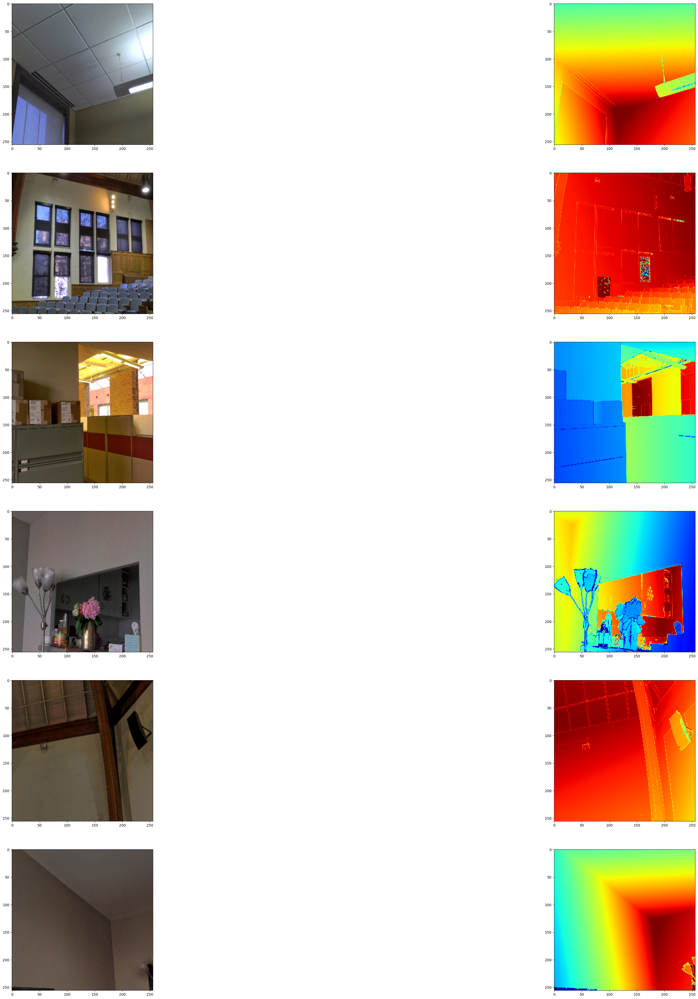

In [6]:
def visualize_depth_map(samples, test=False, model=None):
    """
    Visualiza mapas de profundidade a partir de amostras de dados.

    Args:
    - samples: Tupla contendo as imagens de entrada e os mapas de profundidade esperados (input, target).
    - test: Se True, o modelo será utilizado para gerar previsões sobre os dados de entrada. (padrão: False)
    - model: Modelo treinado que será usado para prever os mapas de profundidade (necessário se test=True).
    """
    input, target = samples  # Desempacota as amostras de entrada e os mapas de profundidade.
    cmap = plt.cm.jet  # Define o mapa de cores para visualização.
    cmap.set_bad(color="black")  # Define a cor preta para valores ausentes ou mascarados.

    if test:
        # Se estiver no modo de teste, utiliza o modelo para prever os mapas de profundidade.
        pred = model.predict(input)

        # Cria uma figura com subplots (6 linhas, 3 colunas) para visualização de entrada, alvo e previsão.
        fig, ax = plt.subplots(6, 3, figsize=(50, 50))
        for i in range(6):
            # Exibe a imagem de entrada.
            ax[i, 0].imshow(input[i].squeeze())
            # Exibe o mapa de profundidade esperado (alvo).
            ax[i, 1].imshow(target[i].squeeze(), cmap=cmap)
            # Exibe o mapa de profundidade previsto pelo modelo.
            ax[i, 2].imshow(pred[i].squeeze(), cmap=cmap)
    else:
        # Cria uma figura com subplots (6 linhas, 2 colunas) para entrada e alvo.
        fig, ax = plt.subplots(6, 2, figsize=(50, 50))
        for i in range(6):
            # Exibe a imagem de entrada.
            ax[i, 0].imshow(input[i].squeeze())
            # Exibe o mapa de profundidade esperado (alvo).
            ax[i, 1].imshow(target[i].squeeze(), cmap=cmap)

# Gera um lote de amostras para visualização usando o DataGenerator.
visualize_samples = next(
    iter(DataGenerator(data=df, batch_size=6, dim=(HEIGHT, WIDTH)))
)

# Visualiza os mapas de profundidade das amostras geradas.
visualize_depth_map(visualize_samples)


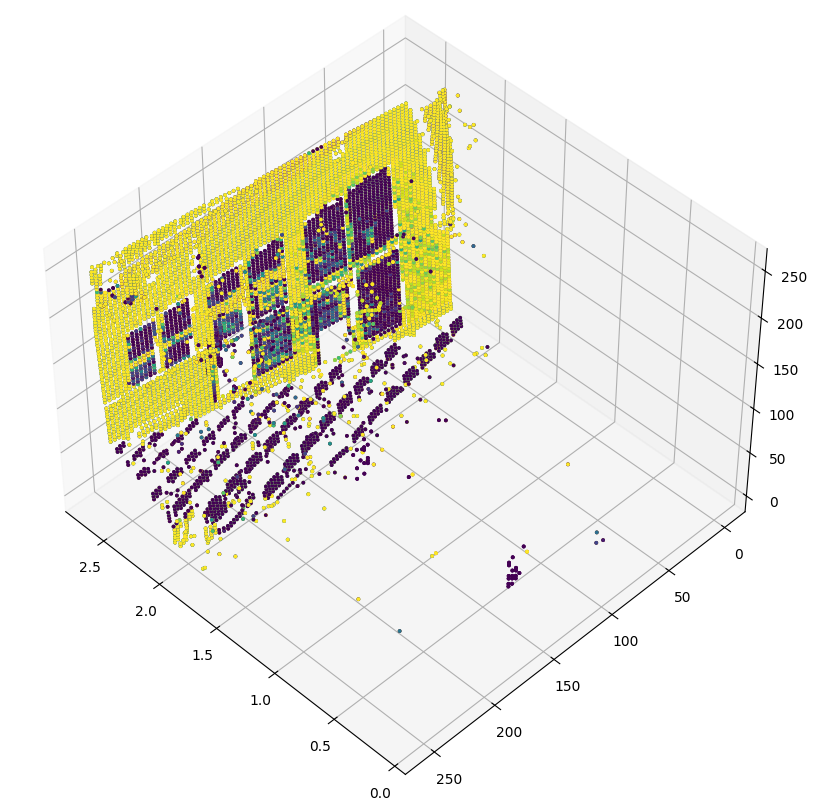

In [7]:
# Inverte a orientação do mapa de profundidade para visualização.
depth_vis = np.flipud(visualize_samples[1][1].squeeze())  # target (mapa de profundidade)
# Inverte a orientação da imagem de entrada para visualização.
img_vis = np.flipud(visualize_samples[0][1].squeeze())  # input (imagem)

# Cria uma figura de visualização 3D.
fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection="3d")  # Define a projeção 3D para os gráficos.

STEP = 3  # Define o passo (intervalo de amostras) para iterar sobre a imagem.

# Itera sobre cada ponto da imagem com o passo definido.
for x in range(0, img_vis.shape[0], STEP):
    for y in range(0, img_vis.shape[1], STEP):
        # Cria uma nuvem de pontos 3D com base na profundidade e posição da imagem.
        ax.scatter(
            [depth_vis[x, y]] * 3,  # Profundidade para o ponto (repete 3 vezes para o eixo Z).
            [y] * 3,  # Coordenada Y do ponto (repete 3 vezes para o eixo Y).
            [x] * 3,  # Coordenada X do ponto (repete 3 vezes para o eixo X).
            c=tuple(img_vis[x, y, :3] / 255),  # Cor do ponto com base na imagem (RGB normalizado).
            s=3,  # Tamanho do ponto no gráfico.
        )

# Define o ângulo de visão da visualização 3D (ângulo de azimute e elevação).
ax.view_init(45, 135)


In [8]:
class DownscaleBlock(layers.Layer):
    """
    Bloco de rede neural para reduzir a resolução espacial usando convoluções, ReLU,
    normalização em lote e pooling.

    Args:
    - filters: Número de filtros para as camadas convolucionais.
    - kernel_size: Tamanho do kernel para as camadas convolucionais (padrão: (3, 3)).
    - padding: Tipo de padding utilizado nas camadas convolucionais (padrão: "same").
    - strides: Passo da convolução (padrão: 1).
    """
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        # Definindo as camadas convolucionais, ReLU, normalização e pooling.
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(negative_slope=0.2)
        self.reluB = layers.LeakyReLU(negative_slope=0.2)
        self.bn2a = layers.BatchNormalization()
        self.bn2b = layers.BatchNormalization()

        # Camada de pooling para reduzir a resolução.
        self.pool = layers.MaxPool2D((2, 2), (2, 2))

    def call(self, input_tensor):
        """
        Realiza a passagem de dados pela camada de downscale.

        Args:
        - input_tensor: Tensor de entrada (imagem).

        Returns:
        - x: Saída da convolução com residual.
        - p: Resultado da operação de pooling.
        """
        d = self.convA(input_tensor)
        x = self.bn2a(d)
        x = self.reluA(x)

        x = self.convB(x)
        x = self.bn2b(x)
        x = self.reluB(x)

        # Adiciona o valor residual.
        x += d
        p = self.pool(x)  # Aplica o pooling para reduzir a resolução.

        return x, p


class UpscaleBlock(layers.Layer):
    """
    Bloco de rede neural para aumentar a resolução espacial usando upsampling,
    convoluções, ReLU, normalização em lote e concatenação com skip connection.

    Args:
    - filters: Número de filtros para as camadas convolucionais.
    - kernel_size: Tamanho do kernel para as camadas convolucionais (padrão: (3, 3)).
    - padding: Tipo de padding utilizado nas camadas convolucionais (padrão: "same").
    - strides: Passo da convolução (padrão: 1).
    """
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        # Definindo as camadas de upsampling, convoluções, ReLU, normalização e concatenação.
        self.us = layers.UpSampling2D((2, 2))
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(negative_slope=0.2)
        self.reluB = layers.LeakyReLU(negative_slope=0.2)
        self.bn2a = layers.BatchNormalization()
        self.bn2b = layers.BatchNormalization()
        self.conc = layers.Concatenate()

    def call(self, x, skip):
        """
        Realiza a passagem de dados pela camada de upscale, incluindo a operação de upsampling
        e concatenação com skip connection.

        Args:
        - x: Tensor de entrada.
        - skip: Tensor de conexão de pulo (skip connection) da camada anterior.

        Returns:
        - x: Saída após upsampling, convoluções e concatenação com o skip connection.
        """
        x = self.us(x)  # Realiza o upsampling.
        concat = self.conc([x, skip])  # Concatena a entrada com o skip connection.
        x = self.convA(concat)
        x = self.bn2a(x)
        x = self.reluA(x)

        x = self.convB(x)
        x = self.bn2b(x)
        x = self.reluB(x)

        return x


class BottleNeckBlock(layers.Layer):
    """
    Bloco de garrafa (bottleneck) para reduzir a profundidade do modelo, usando duas
    camadas convolucionais seguidas de ReLU.

    Args:
    - filters: Número de filtros para as camadas convolucionais.
    - kernel_size: Tamanho do kernel para as camadas convolucionais (padrão: (3, 3)).
    - padding: Tipo de padding utilizado nas camadas convolucionais (padrão: "same").
    - strides: Passo da convolução (padrão: 1).
    """
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        # Definindo as camadas convolucionais e ReLU.
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(negative_slope=0.2)
        self.reluB = layers.LeakyReLU(negative_slope=0.2)

    def call(self, x):
        """
        Realiza a passagem de dados pela camada de bottleneck.

        Args:
        - x: Tensor de entrada.

        Returns:
        - x: Saída após passar pelas convoluções e ReLU.
        """
        x = self.convA(x)
        x = self.reluA(x)
        x = self.convB(x)
        x = self.reluB(x)
        return x


In [9]:
def image_gradients(image):
    """
    Calcula os gradientes da imagem nas direções x (horizontal) e y (vertical) usando diferenças finitas.

    Args:
    - image: Tensor 4D de entrada com formato [batch_size, h, w, d].

    Returns:
    - dy: Gradiente da imagem na direção vertical (y).
    - dx: Gradiente da imagem na direção horizontal (x).
    """
    # Verifica se a entrada tem 4 dimensões (batch_size, height, width, depth)
    if len(ops.shape(image)) != 4:
        raise ValueError(
            "image_gradients expects a 4D tensor "
            "[batch_size, h, w, d], not {}.".format(ops.shape(image))
        )

    image_shape = ops.shape(image)
    batch_size, height, width, depth = ops.unstack(image_shape)

    # Calcula os gradientes na direção y (vertical) e x (horizontal)
    dy = image[:, 1:, :, :] - image[:, :-1, :, :]
    dx = image[:, :, 1:, :] - image[:, :, :-1, :]

    # Retorna gradientes com o mesmo tamanho da imagem original, preenchendo com zeros
    shape = ops.stack([batch_size, 1, width, depth])
    dy = ops.concatenate([dy, ops.zeros(shape, dtype=image.dtype)], axis=1)
    dy = ops.reshape(dy, image_shape)

    shape = ops.stack([batch_size, height, 1, depth])
    dx = ops.concatenate([dx, ops.zeros(shape, dtype=image.dtype)], axis=2)
    dx = ops.reshape(dx, image_shape)

    return dy, dx


class DepthEstimationModel(keras.Model):
    """
    Modelo para estimativa de profundidade baseado em uma arquitetura de rede neural convolucional,
    utilizando blocos de downscale, bottleneck e upscale.

    O modelo também inclui cálculo de perdas, como SSIM, L1 e perdas de suavidade de profundidade.
    """
    def __init__(self):
        super().__init__()
        # Pesos para cada tipo de perda (SSIM, L1, suavidade de profundidade)
        self.ssim_loss_weight = 0.85
        self.l1_loss_weight = 0.1
        self.edge_loss_weight = 0.9
        self.loss_metric = keras.metrics.Mean(name="loss")

        # Número de filtros para cada bloco
        f = [16, 32, 64, 128, 256]

        # Blocos de downscale
        self.downscale_blocks = [
            DownscaleBlock(f[0]),
            DownscaleBlock(f[1]),
            DownscaleBlock(f[2]),
            DownscaleBlock(f[3]),
        ]

        # Bloco bottleneck
        self.bottle_neck_block = BottleNeckBlock(f[4])

        # Blocos de upscale
        self.upscale_blocks = [
            UpscaleBlock(f[3]),
            UpscaleBlock(f[2]),
            UpscaleBlock(f[1]),
            UpscaleBlock(f[0]),
        ]

        # Camada final para prever a profundidade
        self.conv_layer = layers.Conv2D(1, (1, 1), padding="same", activation="tanh")

    def calculate_loss(self, target, pred):
        """
        Calcula a perda total combinando perdas de suavidade de profundidade, SSIM e L1.

        Args:
        - target: Valor de profundidade real (verdadeiro).
        - pred: Profundidade prevista.

        Returns:
        - loss: Perda total combinada.
        """
        # Gradientes nas direções x e y para calcular a suavidade de profundidade
        dy_true, dx_true = image_gradients(target)
        dy_pred, dx_pred = image_gradients(pred)

        # Pesos para suavidade com base nos gradientes
        weights_x = ops.cast(ops.exp(ops.mean(ops.abs(dx_true))), "float32")
        weights_y = ops.cast(ops.exp(ops.mean(ops.abs(dy_true))), "float32")

        # Suavidade da profundidade (penaliza grandes variações)
        smoothness_x = dx_pred * weights_x
        smoothness_y = dy_pred * weights_y
        depth_smoothness_loss = ops.mean(abs(smoothness_x)) + ops.mean(abs(smoothness_y))

        # Perda de similaridade estrutural (SSIM)
        ssim_loss = ops.mean(
            1
            - tf.image.ssim(
                target, pred, max_val=WIDTH, filter_size=7, k1=0.01**2, k2=0.03**2
            )
        )

        # Perda L1 (distância absoluta entre a profundidade real e prevista)
        l1_loss = ops.mean(ops.abs(target - pred))

        # Perda total ponderada
        loss = (
            (self.ssim_loss_weight * ssim_loss)
            + (self.l1_loss_weight * l1_loss)
            + (self.edge_loss_weight * depth_smoothness_loss)
        )

        return loss

    @property
    def metrics(self):
        # Métrica de perda
        return [self.loss_metric]

    def train_step(self, batch_data):
        """
        Passo de treinamento onde as variáveis de gradiente são calculadas
        e os gradientes são aplicados para otimizar o modelo.

        Args:
        - batch_data: Dados de entrada e alvo para o treinamento.

        Returns:
        - loss: Perda do modelo durante o treinamento.
        """
        input, target = batch_data
        with tf.GradientTape() as tape:
            pred = self(input, training=True)
            loss = self.calculate_loss(target, pred)

        gradients = tape.gradient(loss, self.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))
        self.loss_metric.update_state(loss)
        return {
            "loss": self.loss_metric.result(),
        }

    def test_step(self, batch_data):
        """
        Passo de teste onde a perda é calculada sem atualização de gradientes.

        Args:
        - batch_data: Dados de entrada e alvo para o teste.

        Returns:
        - loss: Perda do modelo durante o teste.
        """
        input, target = batch_data

        pred = self(input, training=False)
        loss = self.calculate_loss(target, pred)

        self.loss_metric.update_state(loss)
        return {
            "loss": self.loss_metric.result(),
        }

    def call(self, x):
        """
        Passa os dados pela rede neural, aplicando downscale, bottleneck e upscale.

        Args:
        - x: Tensor de entrada (imagem).

        Returns:
        - Resultado da estimativa de profundidade.
        """
        # Passa pela rede aplicando os blocos de downscale e upscale
        c1, p1 = self.downscale_blocks[0](x)
        c2, p2 = self.downscale_blocks[1](p1)
        c3, p3 = self.downscale_blocks[2](p2)
        c4, p4 = self.downscale_blocks[3](p3)

        bn = self.bottle_neck_block(p4)

        u1 = self.upscale_blocks[0](bn, c4)
        u2 = self.upscale_blocks[1](u1, c3)
        u3 = self.upscale_blocks[2](u2, c2)
        u4 = self.upscale_blocks[3](u3, c1)

        return self.conv_layer(u4)  # Previsão final de profundidade


In [10]:
# Definição do otimizador SGD (Stochastic Gradient Descent) com taxa de aprendizado (learning rate) ajustável
optimizer = keras.optimizers.SGD(
    learning_rate=LR,  # Taxa de aprendizado
    nesterov=False,     # Desativa o método de Nesterov (não usaremos aceleração)
)

# Instância do modelo de Estimação de Profundidade
model = DepthEstimationModel()

# Compilando o modelo com o otimizador definido
model.compile(optimizer)

# Inicialização dos carregadores de dados para treinamento e validação
train_loader = DataGenerator(
    data=df[:260].reset_index(drop="true"),  # Primeiros 260 exemplos para treinamento
    batch_size=BATCH_SIZE,  # Tamanho do lote para treinamento
    dim=(HEIGHT, WIDTH),    # Dimensões das imagens (altura, largura)
)

validation_loader = DataGenerator(
    data=df[260:].reset_index(drop="true"),  # Restante dos exemplos para validação
    batch_size=BATCH_SIZE,  # Tamanho do lote para validação
    dim=(HEIGHT, WIDTH),    # Dimensões das imagens (altura, largura)
)

# Inicia o treinamento do modelo com os dados de treinamento e validação
model.fit(
    train_loader,                # Carregador de dados para treinamento
    epochs=EPOCHS,               # Número de épocas para treinamento
    validation_data=validation_loader,  # Carregador de dados para validação
)


Epoch 1/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 72s 5s/step - loss: 0.7656 - val_loss: 0.7738
Epoch 2/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 4s 272ms/step - loss: 0.7159 - val_loss: 0.7592
Epoch 3/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 404ms/step - loss: 0.7564 - val_loss: 0.7472
Epoch 4/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 4s 274ms/step - loss: 0.6994 - val_loss: 0.7349
Epoch 5/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 4s 272ms/step - loss: 0.6707 - val_loss: 0.7226
Epoch 6/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 337ms/step - loss: 0.6958 - val_loss: 0.7101
Epoch 7/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 4s 269ms/step - loss: 0.7313 - val_loss: 0.7003
Epoch 8/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 273ms/step - loss: 0.6578 - val_loss: 0.6912
Epoch 9/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 267ms/step - loss: 0.6916 - val_loss: 0.6805
Epoch 10/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 4s 276ms/step - loss: 0.7005 - val_loss: 0.6696
Epoch 11/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 4s 332ms/step - loss: 0.7022 - val_loss: 0.6591
Epoch 12/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 269ms/step - loss: 0.7028 - val_loss

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


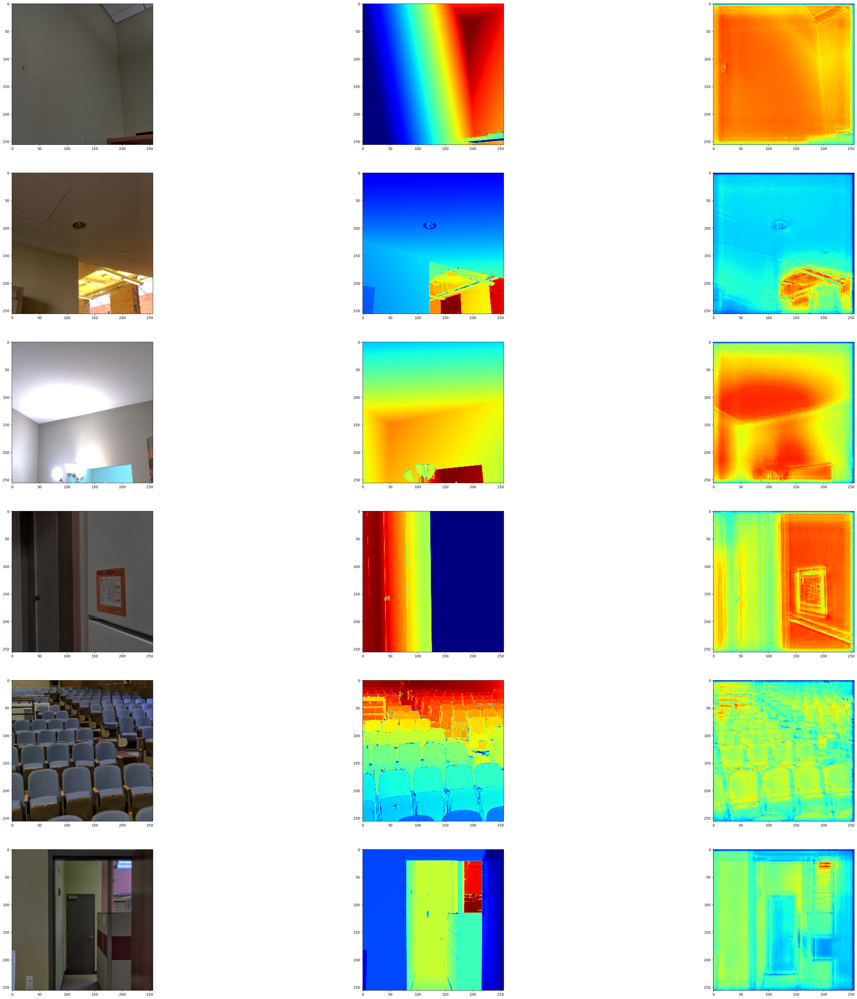

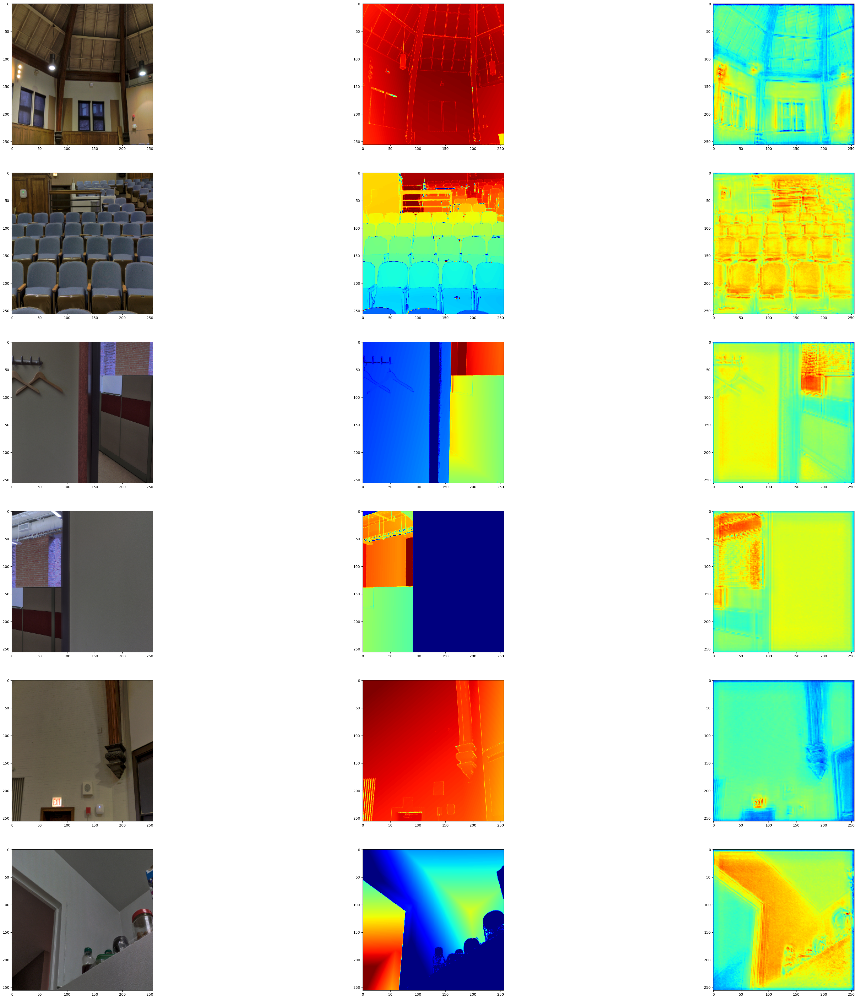

In [11]:
# Carregador de dados para o conjunto de testes (dados a partir do índice 265)
test_loader = next(
    iter(
        DataGenerator(
            data=df[265:].reset_index(drop="true"),  # Dados a partir do índice 265 até o final
            batch_size=6,                           # Tamanho do lote para os testes
            dim=(HEIGHT, WIDTH),                    # Dimensões das imagens (altura, largura)
        )
    )
)

# Visualizando o mapa de profundidade gerado para os dados de teste usando o modelo treinado
visualize_depth_map(test_loader, test=True, model=model)

# Carregador de dados para outro conjunto de testes (dados a partir do índice 300)
test_loader = next(
    iter(
        DataGenerator(
            data=df[300:].reset_index(drop="true"),  # Dados a partir do índice 300 até o final
            batch_size=6,                           # Tamanho do lote para os testes
            dim=(HEIGHT, WIDTH),                    # Dimensões das imagens (altura, largura)
        )
    )
)

# Visualizando novamente o mapa de profundidade para o segundo conjunto de dados de teste
visualize_depth_map(test_loader, test=True, model=model)
